
<br>
<font face="Times New Roman">
<div dir=ltr align=center>
<font color=0F5298 size=7>
Digital Image Processing <br>
<font color=2565AE size=5>
Department Of Mathematical Sciences <br>
Spring 2025<br>
<font color=3C99D size=5>
Assignment 1 <br>
</div>


---



### Full Name : Kasra Siavashpour
### Student Number :99109903
___

## Introduction

In this assignment, we are going to investigate some of the basic methods of image enhancement.

## Section 1: Image Enhancement

Importing necessary Libraries. You cannot import and use any other libraries

In [1]:
# Do not modify this cell
import cv2
import numpy as np
import matplotlib.pylab as plt


### Q1: Intensity Enhancement


In this question, you will implement some of the intensity processing functions and apply them on a given image. In the final part, you will be asked to use these functions to enhance the intensity of a given image.

<ol>
<li>
 <b>Negative Transform :</b> $y=255-x$

 <li>
 <b>Log Transform :</b> $y=\frac{255 \log(1+ \alpha x)}{\log(1+255 \alpha)}$

 <li>
 <b>Gamma Transform :</b> $y=255(\frac{x}{255})^{\gamma}$

 </ol>

In the following cells, complete the functions for

In [2]:
def negative_transform(img: np.ndarray):
 
  return 255 - img.copy()

In [3]:
def log_transform(img: np.ndarray, alpha):
  img_copy = img.copy().astype(float)
  
  # Apply log transform
  numerator = np.log1p(alpha * img_copy)  # log(1 + alpha*x)
  denominator = np.log1p(255 * alpha)     # log(1 + 255*alpha)
  
  transformed = 255 * numerator / denominator
  
  # Convert back to uint8
  return np.uint8(transformed)


In [4]:
def gamma_transform(img: np.ndarray, gamma):
  img_copy = img.copy().astype(float)
  
  # Apply gamma transform
  transformed = 255 * ((img_copy / 255) ** gamma)
  
  # Convert back to uint8
  return np.uint8(transformed)

Now, apply these transformations on `Q1-input1.jpg` (on RGB channels) and save the output images in `Q1-output-neg.jpg`, `Q1-output-log.jpg` and `Q1-output-gamma.jpg`, respectively. You can set $\alpha$ and $\gamma$ whatever you want, but effect on the intensity of the image should be noticable.

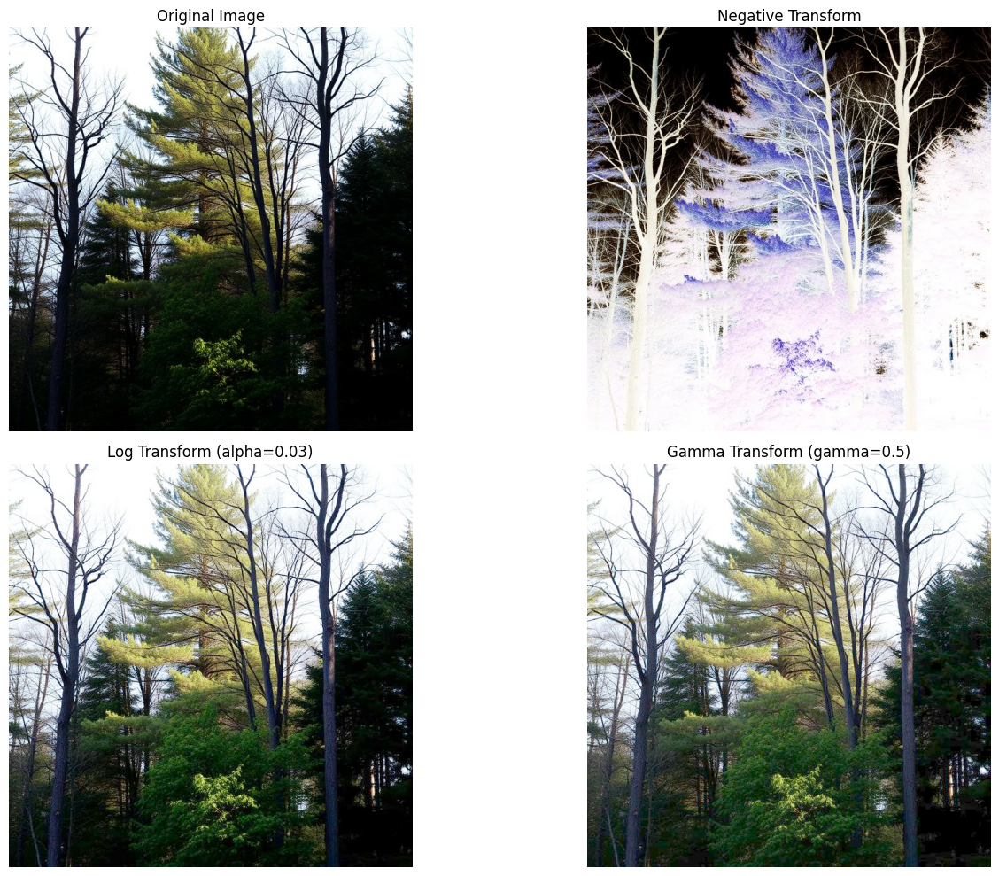

In [5]:
img = cv2.imread('Q1-input1.jpg')

# Apply negative transform
neg_img = negative_transform(img)
cv2.imwrite('Q1-output-neg.jpg', neg_img)

# Apply log transform with alpha=0.03
# Using a smaller alpha value enhances darker regions
log_img = log_transform(img, alpha=0.03)
cv2.imwrite('Q1-output-log.jpg', log_img)

# Apply gamma transform with gamma=0.5
# gamma < 1 brightens dark regions
# gamma > 1 darkens bright regions
gamma_img = gamma_transform(img, gamma=0.5)
cv2.imwrite('Q1-output-gamma.jpg', gamma_img)

# Display the original and transformed images
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(neg_img, cv2.COLOR_BGR2RGB))
plt.title('Negative Transform')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(log_img, cv2.COLOR_BGR2RGB))
plt.title('Log Transform (alpha=0.03)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(gamma_img, cv2.COLOR_BGR2RGB))
plt.title('Gamma Transform (gamma=0.5)')
plt.axis('off')

plt.tight_layout()
plt.show()

Finally, use the functions you implemented to enhance the intensity of `Q1-input2.jpg`. You may use any of the functions in anyway you desire. Your final score on the question depends on the quality of the output. Save the output image as `Q1-output-enhanced.jpg`.

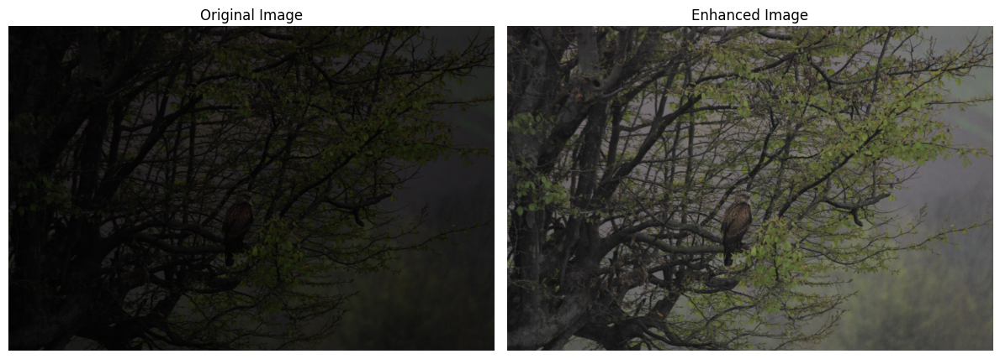

In [6]:
img = cv2.imread('Q1-input2.jpg')


enhanced = log_transform(img, alpha=0.04)

enhanced = gamma_transform(enhanced, gamma=0.85)

cv2.imwrite('Q1-output-enhanced.jpg', enhanced)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB))
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Q2: Histogram Specification


In this question, we will implement histogram specification for intensity enhancement.

Complete the following code to specify the histogram of the input image, with a given histogram `hist1`, to target histogram `hist2`.

**Note**: Assume that the input image has only one channel, i.e, it is a $H \times W$ numpy array.

In [7]:
def histogram_specification(img: np.ndarray, hist1: np.ndarray, hist2: np.ndarray):

    cdf1 = np.cumsum(hist1) / np.sum(hist1)  
    cdf2 = np.cumsum(hist2) / np.sum(hist2)  
   
    mapping = np.zeros(256, dtype=np.uint8)
    
    for i in range(256):
        j = np.argmin(np.abs(cdf2 - cdf1[i]))
        mapping[i] = j
    
    result = mapping[img]
    
    return result

To test the above code, open `Q2-input1.jpg` and `Q2-input2.jpg`, and convert the histogram of the first one to the second one. Save the resulting image as `Q2-output.jpg`. The aim of specifying the histograms is to enhance the first image, so your score depends on the quality of your result.

/var/folders/gb/gv4cvtzs0132t33dyv7s_prr0000gn/T/ipykernel_78944/1295617703.py:25: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(img1.flatten(), 256, [0, 256], color='r')
/var/folders/gb/gv4cvtzs0132t33dyv7s_prr0000gn/T/ipykernel_78944/1295617703.py:37: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(img2.flatten(), 256, [0, 256], color='g')
/var/folders/gb/gv4cvtzs0132t33dyv7s_prr0000gn/T/ipykernel_78944/1295617703.py:49: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(result.flatten(), 256, [0, 256], color='b')


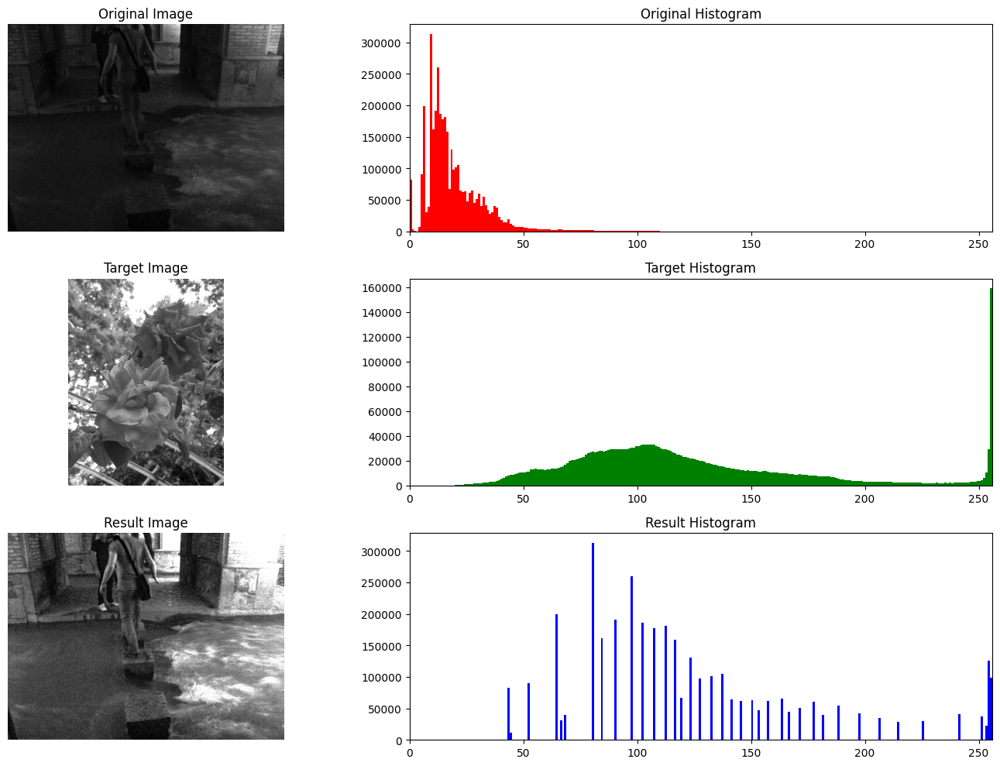

In [8]:
img1 = cv2.imread('Q2-input1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Q2-input2.jpg', cv2.IMREAD_GRAYSCALE)

# Calculate histograms
hist1, _ = np.histogram(img1.flatten(), 256, [0, 256])
hist2, _ = np.histogram(img2.flatten(), 256, [0, 256])

# Apply histogram specification
result = histogram_specification(img1, hist1, hist2)

# Save the result
cv2.imwrite('Q2-output.jpg', result)

# Display the original, target, and result images along with their histograms
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(3, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Original histogram
plt.subplot(3, 2, 2)
plt.hist(img1.flatten(), 256, [0, 256], color='r')
plt.xlim([0, 256])
plt.title('Original Histogram')

# Target image
plt.subplot(3, 2, 3)
plt.imshow(img2, cmap='gray')
plt.title('Target Image')
plt.axis('off')

# Target histogram
plt.subplot(3, 2, 4)
plt.hist(img2.flatten(), 256, [0, 256], color='g')
plt.xlim([0, 256])
plt.title('Target Histogram')

# Result image
plt.subplot(3, 2, 5)
plt.imshow(result, cmap='gray')
plt.title('Result Image')
plt.axis('off')

# Result histogram
plt.subplot(3, 2, 6)
plt.hist(result.flatten(), 256, [0, 256], color='b')
plt.xlim([0, 256])
plt.title('Result Histogram')

plt.tight_layout()
plt.show()

### Q3: Color Processing

In image `Q3-input.jpg`, change the color of the flowers red, blue and yellow to violet, pink and orange respectively. Save the result as `Q3-output.jpg`. Your score of this question depends on the quality of the output image.

Color processing complete!
Files created:
- Q3-output.jpg (main result)
- Q3-comparison.jpg (before/after comparison)
- debug_mask_*.jpg (color detection masks)

Color mappings applied:
- Red flower → Violet
- Blue flower → Pink
- Yellow flower → Orange


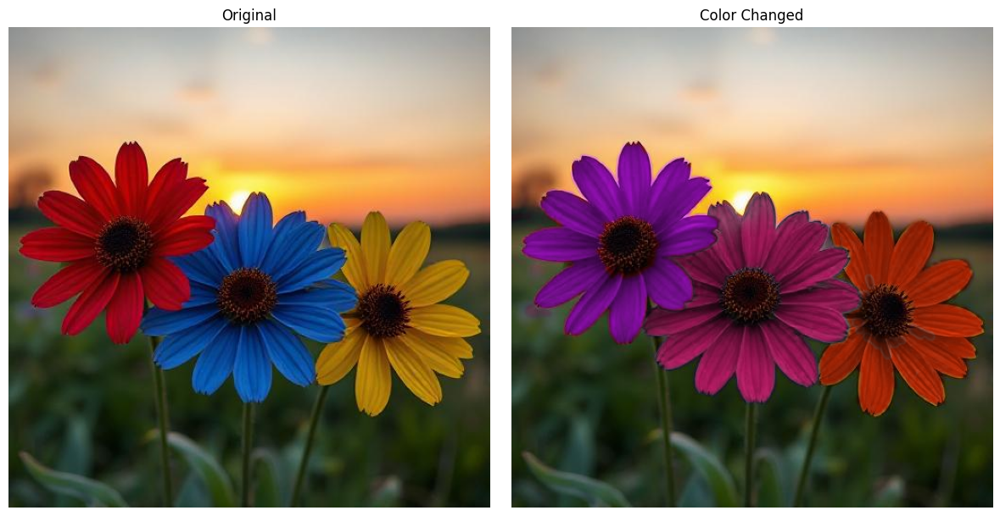

In [34]:
import cv2
import numpy as np

img = cv2.imread('Q3-input.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

lower_red1 = np.array([0, 223, 64])
upper_red1 = np.array([15, 255, 191])
lower_red2 = np.array([165, 223, 64])
upper_red2 = np.array([179, 255, 191])

lower_blue1 = np.array([100, 30, 10])
upper_blue1 = np.array([130, 255, 255])
lower_blue2 = np.array([131, 30, 10])
upper_blue2 = np.array([145, 255, 255])

lower_yellow = np.array([8, 189, 39])
upper_yellow = np.array([28, 255, 208])



mask_red1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask_red2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask_red = cv2.bitwise_or(mask_red1,mask_red2)

mask1 = cv2.inRange(hsv, lower_blue1, upper_blue1)
mask2 = cv2.inRange(hsv, lower_blue2, upper_blue2)


mask_blue = cv2.bitwise_or(mask1, mask2)

mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)


kernel = np.ones((3,3), np.uint8)
mask_red = cv2.morphologyEx(mask_red, cv2.MORPH_OPEN, kernel)
mask_red = cv2.morphologyEx(mask_red, cv2.MORPH_CLOSE, kernel)
mask_red = cv2.dilate(mask_red, kernel, iterations=1)

mask_blue = cv2.morphologyEx(mask_blue, cv2.MORPH_OPEN, kernel)
mask_blue = cv2.morphologyEx(mask_blue, cv2.MORPH_CLOSE, kernel)
mask_blue = cv2.dilate(mask_blue, kernel, iterations=1)

mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_OPEN, kernel)
mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_CLOSE, kernel)
mask_yellow = cv2.dilate(mask_yellow, kernel, iterations=1)


def replace_flower_color(image, mask, target_color_bgr):
    """Replace flower color while preserving natural appearance"""
    result = image.copy()
    
    
    hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV).astype(np.float32)
    
    
    target_hsv = cv2.cvtColor(np.uint8([[target_color_bgr]]), cv2.COLOR_BGR2HSV)[0][0]
    target_hue = target_hsv[0]
    target_sat = target_hsv[1]
    
    
    mask_smooth = cv2.GaussianBlur(mask, (9, 9), 0)
    mask_norm = mask_smooth.astype(np.float32) / 255.0
    
    
    for y in range(hsv_img.shape[0]):
        for x in range(hsv_img.shape[1]):
            if mask_norm[y, x] > 0.1:  
                
                hsv_img[y, x, 0] = target_hue
                
                
                original_sat = hsv_img[y, x, 1]
                hsv_img[y, x, 1] = original_sat * 0.7 + target_sat * 0.3
                
                
                hsv_img[y, x, 2] = hsv_img[y, x, 2] * 0.95
    
    
    hsv_img = np.clip(hsv_img, 0, 255).astype(np.uint8)
    new_colored = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2BGR)
    
    
    for c in range(3):
        result[:,:,c] = (image[:,:,c] * (1 - mask_norm) + new_colored[:,:,c] * mask_norm).astype(np.uint8)
    
    return result


violet_bgr = np.array([210, 50, 180])    
pink_bgr = np.array([170, 100, 255])     
orange_bgr = np.array([0, 50, 255])   

result = img.copy()
result = replace_flower_color(result, mask_red, violet_bgr)
result = replace_flower_color(result, mask_blue, pink_bgr)
result = replace_flower_color(result, mask_yellow, orange_bgr)
cv2.imwrite('Q3-output.jpg', result)

cv2.imwrite('debug_mask_red.jpg', mask_red)
cv2.imwrite('debug_mask_blue.jpg', mask_blue)
cv2.imwrite('debug_mask_yellow.jpg', mask_yellow)


comparison = np.hstack([img, result])
cv2.imwrite('Q3-comparison.jpg', comparison)

print("Color processing complete!")
print("Files created:")
print("- Q3-output.jpg (main result)")
print("- Q3-comparison.jpg (before/after comparison)")
print("- debug_mask_*.jpg (color detection masks)")


print("\nColor mappings applied:")
print("- Red flower → Violet")
print("- Blue flower → Pink")
print("- Yellow flower → Orange")


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.axis("off")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title("Color Changed")
plt.axis("off")
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()

## Section 2: Spatial Filters

### Q4: Blurring

In this question, you are going to implement a function to blur a given image using a specified method. Your function should support box filter, gaussian filter and median filter. It is permitted to use `opencv` to perform the bluring.

In [10]:
def blur(img: np.ndarray, kernel_size: int, filter_type: str):

    if kernel_size % 2 == 0:
        kernel_size += 1
    
    if filter_type.lower() == 'box':
        return cv2.blur(img, (kernel_size, kernel_size))
    
    elif filter_type.lower() == 'gaussian':

        sigma = 0.3*((kernel_size-1)*0.5 - 1) + 0.8
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
    
    elif filter_type.lower() == 'median':
        return cv2.medianBlur(img, kernel_size)
    
    else:
        raise ValueError("Filter type must be 'box', 'gaussian', or 'median'.")

Test your code with kernel size $k=3, 11, 25$ for each of filters on `Q4-input.jpg`. Save the output images with the following format:
<ul>
<li> Box filter with kernel size $k=3, 11, 25$ as Q4-output-box3.jpg, Q4-output-box11.jpg and Q4-output-box25.jpg.

<li> Gaussian filter with kernel size $k=3, 11, 25$ as Q4-output-gauss3.jpg, Q4-output-gauss11.jpg and Q4-output-gauss25.jpg (you can set $\sigma$ whaever you wish, but blurring should be observable).

<li> Median filter with kernel size $k=3, 11, 25$ as Q4-output-med3.jpg, Q4-output-med11.jpg and Q4-output-med25.jpg.
</ul>

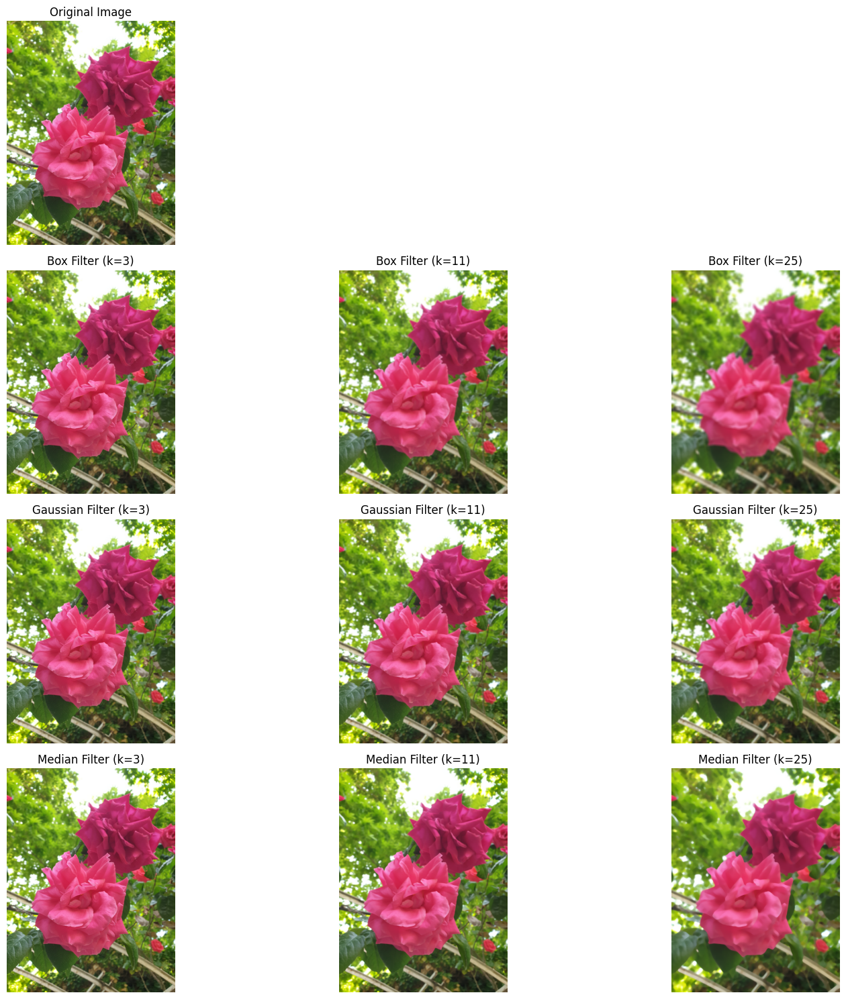

In [11]:
img = cv2.imread('Q4-input.jpg')

kernel_sizes = [3, 11, 25]

for k in kernel_sizes:
    result = blur(img, k, 'box')
    cv2.imwrite(f'Q4-output-box{k}.jpg', result)

for k in kernel_sizes:
    result = blur(img, k, 'gaussian')
    cv2.imwrite(f'Q4-output-gauss{k}.jpg', result)

for k in kernel_sizes:
    result = blur(img, k, 'median')
    cv2.imwrite(f'Q4-output-med{k}.jpg', result)

# Display the results
plt.figure(figsize=(15, 15))

# Original image
plt.subplot(4, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Box filter results
for i, k in enumerate(kernel_sizes):
    plt.subplot(4, 3, i + 4)
    blurred = blur(img, k, 'box')
    plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    plt.title(f'Box Filter (k={k})')
    plt.axis('off')

# Gaussian filter results
for i, k in enumerate(kernel_sizes):
    plt.subplot(4, 3, i + 7)
    blurred = blur(img, k, 'gaussian')
    plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    plt.title(f'Gaussian Filter (k={k})')
    plt.axis('off')

# Median filter results
for i, k in enumerate(kernel_sizes):
    plt.subplot(4, 3, i + 10)
    blurred = blur(img, k, 'median')
    plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    plt.title(f'Median Filter (k={k})')
    plt.axis('off')

plt.tight_layout()
plt.show()

### Q5: Sharpening

In this question, you are going to sharpen a given image using Gaussian Filter.


Let $f$ be the source image and $g$ be the Gaussian kernel, then $f*g$ is the convolution of the image with this kernel, which results in a blurred image.

To sharpen the image, we can generate an unsharp mask by subtracting the blurred image from the original image:
$$m=f-f*g$$
This mask is a transparent image which has higher intensity on the edges of the original image. Now we may add this mask with a weight $\alpha$ to sharpen the original image:
$$f'=f+ \alpha m$$

First, complete the following function to generate a Gaussian kernel with a given size and $\sigma$. A $(2k+1) \times (2k+1)$ Gaussian kernel has the value $e^{\frac{-(x^2+y^2)}{2 \sigma^2}}$ at point $(x,y)$ (Center of the kernel has coordinates $(0,0)$, and we have $x,y \in [-k,k]$). You should also normalize the kernel (sum of the entries should app up to 1)

In [12]:
def gaussian_kernel(kernel_size: int, sigma):
  
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    k = (kernel_size - 1) // 2
    
    
    y, x = np.mgrid[-k:k+1, -k:k+1]
    
    
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    
    
    return kernel / np.sum(kernel)



Next, complete the following function to sharpen a given image and Gaussian kernel and $\alpha$. Your function should return both the sharpened image and the unsharp mask.

In [13]:
def gaussian_sharpen(img: np.ndarray, kernel: np.ndarray, alpha: float):


    blurred = cv2.filter2D(img, -1, kernel)
    

    unsharp_mask = img.astype(float) - blurred.astype(float)
    

    sharpened = img.astype(float) + alpha * unsharp_mask
    

    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    

    mask_normalized = cv2.normalize(unsharp_mask, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    return sharpened, mask_normalized

Now to test your code, open `Q5-input.jpg` and sharpen it using the above function. Use a kernel size of 7 and choose a suitable value of $\sigma$ and $\alpha$ to get a desirable result. Save the sharpened image as `Q5-output-1.jpg` and the unsharp mask (grayscale image) as `Q5-output-2.jpg`. Your score on this part depends on the quality of the result.

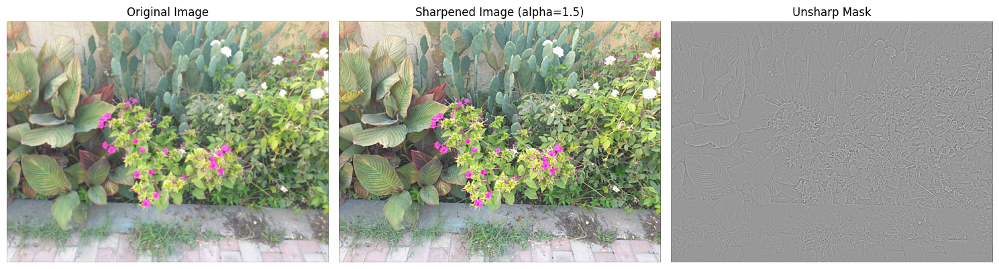

In [36]:
img = cv2.imread('Q5-input.png')

# Create a Gaussian kernel with size 7 and sigma 1.5
kernel_size = 7
sigma = 1.5
kernel = gaussian_kernel(kernel_size, sigma)

# Apply the sharpening with alpha=1.5
alpha = 1.5
sharpened, unsharp_mask = gaussian_sharpen(img, kernel, alpha)

# Save the sharpened image and unsharp mask
cv2.imwrite('Q5-output-1.png', sharpened)

# Convert unsharp mask to grayscale if it's a color image
if len(unsharp_mask.shape) == 3:
    unsharp_mask_gray = cv2.cvtColor(unsharp_mask, cv2.COLOR_BGR2GRAY)
else:
    unsharp_mask_gray = unsharp_mask

cv2.imwrite('Q5-output-2.png', unsharp_mask_gray)

# Display the original, sharpened images, and unsharp mask
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))
plt.title(f'Sharpened Image (alpha={alpha})')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(unsharp_mask_gray, cmap='gray')
plt.title('Unsharp Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

### Q6: Noise removal

## A) ACE Function
Implement the ACE function using ready-made functions for histogram equalization and padding. Apply the function with different grid sizes on ACE.jpg image and report the output for each one. Also specify which output is the best.

## B) CLAHE Function
Implement the CLAHE function and apply it to CLAHE.jpg image. Also specify which output is the best. In this function, test different values for the clipping threshold and grid size, analyze the effect of each, and output the best result.

## C) add_noise Function
Complete the add_noise function to add Gaussian or Salt-and-Pepper noise to the image. Using existing library functions is not allowed. Read the noise.tif image in grayscale and add Gaussian and Salt-and-Pepper noise separately to the image and display the output.

## D) denoise Function
Save the image resulting from adding Salt-and-Pepper noise and denoise it using an appropriate filter.

In [15]:
def ACE(image, gridSize):

    output = image.copy()
    
    # Get image dimensions
    height, width = image.shape[:2]
    
    # Determine grid width and height
    grid_h, grid_w = gridSize
    
    # Add padding to the image to handle boundary regions
    pad_h = grid_h // 2
    pad_w = grid_w // 2
    padded_img = cv2.copyMakeBorder(
        image, 
        pad_h, pad_h, pad_w, pad_w, 
        cv2.BORDER_REFLECT
    )
    
    # Process each grid in the image
    for i in range(0, height, grid_h):
        for j in range(0, width, grid_w):
            # Define region boundaries with padding
            y_start = i
            y_end = min(i + grid_h, height)
            x_start = j
            x_end = min(j + grid_w, width)
            
            # Extract the region with padding for processing
            region = padded_img[y_start:y_end+2*pad_h, x_start:x_end+2*pad_w]
            
            # Apply histogram equalization to the region
            if len(image.shape) == 3:  # Color image
                # Convert to YCrCb color space
                region_ycrcb = cv2.cvtColor(region, cv2.COLOR_BGR2YCrCb)
                
                # Apply histogram equalization to Y channel
                region_ycrcb[:,:,0] = cv2.equalizeHist(region_ycrcb[:,:,0])
                
                # Convert back to BGR
                region_eq = cv2.cvtColor(region_ycrcb, cv2.COLOR_YCrCb2BGR)
                
                # Update the output image
                output[y_start:y_end, x_start:x_end] = region_eq[pad_h:pad_h+(y_end-y_start), 
                                                            pad_w:pad_w+(x_end-x_start)]
            else:  # Grayscale image
                region_eq = cv2.equalizeHist(region)
                
                # Update the output image
                output[y_start:y_end, x_start:x_end] = region_eq[pad_h:pad_h+(y_end-y_start), 
                                                            pad_w:pad_w+(x_end-x_start)]
    
    return output

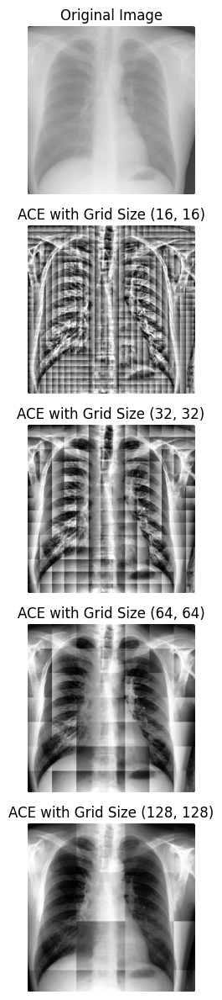

The best result is achieved with grid size (64, 64)


In [16]:
# Load the ACE.jpg image
img = cv2.imread('ACE.jpg')

# Define different grid sizes to test
grid_sizes = [(16, 16), (32, 32), (64, 64), (128, 128)]

# Apply ACE with different grid sizes
results = []
for grid_size in grid_sizes:
    result = ACE(img, grid_size)
    results.append(result)

# Display the results
plt.figure(figsize=(15, 12))

# Original image
plt.subplot(len(grid_sizes) + 1, 1, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# ACE results with different grid sizes
for i, (grid_size, result) in enumerate(zip(grid_sizes, results)):
    plt.subplot(len(grid_sizes) + 1, 1, i + 2)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f'ACE with Grid Size {grid_size}')
    plt.axis('off')

plt.tight_layout()
plt.show()

best_grid_size_index = 2  
cv2.imwrite('ACE_best_result.jpg', results[best_grid_size_index])

print(f"The best result is achieved with grid size {grid_sizes[best_grid_size_index]}")

In [17]:
def CLAHE(image, gridSize, threshold):

  # Check if the image is grayscale or color
  if len(image.shape) == 2:
    # Grayscale image
    height, width = image.shape
    output = np.zeros((height, width), dtype=np.uint8)
  else:
    # Color image
    height, width, channels = image.shape
    output = np.zeros((height, width, channels), dtype=np.uint8)
    
  # Calculate grid dimensions
  grid_h, grid_w = gridSize
  
  # Calculate step size for grid traversal
  step_h = height // grid_h
  step_w = width // grid_w
  
  # Process image
  if len(image.shape) == 2:  # Grayscale image
    # Process each grid block
    for i in range(grid_h):
      for j in range(grid_w):
        # Define the grid block boundaries
        y_start = i * step_h
        y_end = (i + 1) * step_h if i < grid_h - 1 else height
        x_start = j * step_w
        x_end = (j + 1) * step_w if j < grid_w - 1 else width
        
        # Extract the block
        block = image[y_start:y_end, x_start:x_end]
        
        # Calculate histogram
        hist, bins = np.histogram(block.flatten(), 256, [0, 256])
        
        # Apply contrast limiting
        hist_clipped = np.clip(hist, 0, threshold)
        
        # Redistribute clipped pixels
        excess = np.sum(hist - hist_clipped)
        redistribution_value = excess / 256
        hist_clipped = hist_clipped + redistribution_value
        
        # Calculate CDF
        cdf = hist_clipped.cumsum()
        
        # Normalize CDF
        if cdf[-1] == 0:
          continue  # Skip if the CDF is zero
        cdf_normalized = (cdf * 255 / cdf[-1]).astype(np.uint8)
        
        # Apply mapping to block
        for y in range(y_start, y_end):
          for x in range(x_start, x_end):
            output[y, x] = cdf_normalized[image[y, x]]
  else:  # Color image
    # Convert to LAB color space (better for CLAHE)
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Process the L channel (luminance)
    l_channel = lab_image[:, :, 0]
    equalized_l_channel = np.zeros_like(l_channel)
    
    # Process each grid block for L channel
    for i in range(grid_h):
      for j in range(grid_w):
        # Define the grid block boundaries
        y_start = i * step_h
        y_end = (i + 1) * step_h if i < grid_h - 1 else height
        x_start = j * step_w
        x_end = (j + 1) * step_w if j < grid_w - 1 else width
        
        # Extract the block
        block = l_channel[y_start:y_end, x_start:x_end]
        
        # Calculate histogram
        hist, bins = np.histogram(block.flatten(), 256, [0, 256])
        
        # Apply contrast limiting
        hist_clipped = np.clip(hist, 0, threshold)
        
        # Redistribute clipped pixels
        excess = np.sum(hist - hist_clipped)
        redistribution_value = excess / 256
        hist_clipped = hist_clipped + redistribution_value
        
        # Calculate CDF
        cdf = hist_clipped.cumsum()
        
        # Normalize CDF
        if cdf[-1] == 0:
          continue  # Skip if the CDF is zero
        cdf_normalized = (cdf * 255 / cdf[-1]).astype(np.uint8)
        
        # Apply mapping to block
        for y in range(y_start, y_end):
          for x in range(x_start, x_end):
            equalized_l_channel[y, x] = cdf_normalized[l_channel[y, x]]
    
    # Replace the L channel and convert back to RGB
    lab_image[:, :, 0] = equalized_l_channel
    output = cv2.cvtColor(lab_image, cv2.COLOR_LAB2RGB)
    
  return output

/var/folders/gb/gv4cvtzs0132t33dyv7s_prr0000gn/T/ipykernel_78944/3697125839.py:28: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


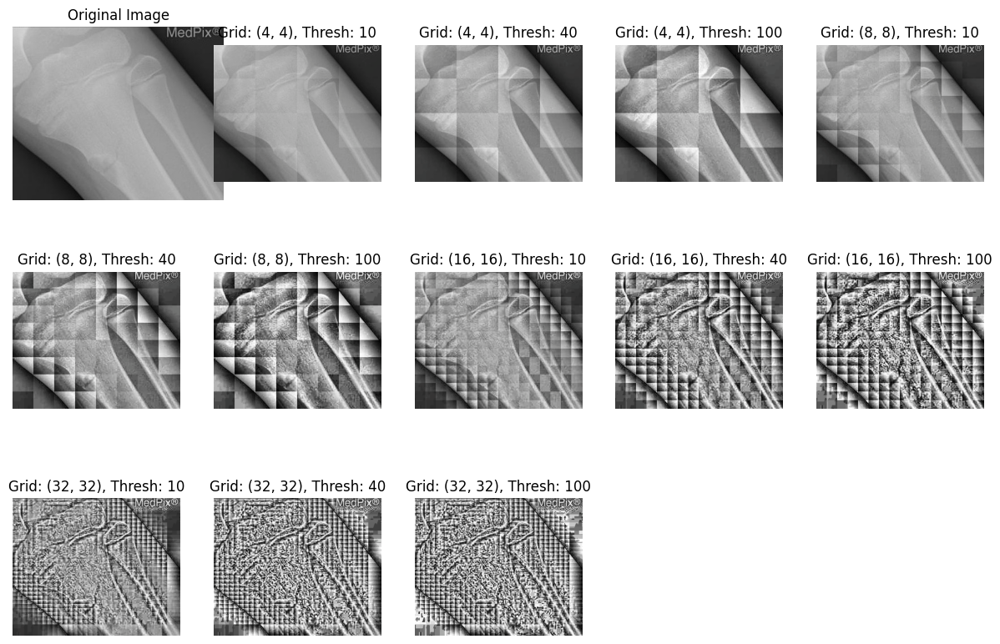

The best CLAHE result is achieved with a grid size of (8, 8) and threshold 40.
This combination provides good local contrast enhancement while preventing noise amplification.


In [18]:
clahe_image = cv2.imread('CLAHE.jpg')
if len(clahe_image.shape) == 3:
    clahe_image = cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB)

# Define different grid sizes and threshold values to test
grid_sizes = [(4, 4), (8, 8), (16, 16),(32,32)]
thresholds = [10, 40, 100]

plt.figure(figsize=(15, 10))
plt.subplot(3, 4, 1)
plt.imshow(clahe_image)
plt.title('Original Image')
plt.axis('off')

results = []
idx = 2

for size in grid_sizes:
    for thresh in thresholds:
        result = CLAHE(clahe_image, size, thresh)
        plt.subplot(3, 5, idx)
        plt.imshow(result)
        plt.title(f'Grid: {size}, Thresh: {thresh}')
        plt.axis('off')
        results.append((result, size, thresh))
        idx += 1

plt.tight_layout()
plt.show()
best_clahe_idx = 4
best_clahe, best_size, best_thresh = results[best_clahe_idx]
cv2.imwrite('Q6-output-clahe-best.jpg', cv2.cvtColor(best_clahe, cv2.COLOR_RGB2BGR))

print(f"The best CLAHE result is achieved with a grid size of {best_size} and threshold {best_thresh}.")
print("This combination provides good local contrast enhancement while preventing noise amplification.")

In [19]:
def add_noise(image, noise_type, args):

  '''
  inputs:
    image (ndarray): This is the input image represented as a NumPy array.

    noise_type (int): This parameter specifies which type of noise to add.
    It can take the following values:
    0: Gaussian Noise
    1: Salt-and-Pepper Noise

    args (list): A list of arguments that contains additional parameters needed for each noise mode.The required arguments are different depending on the noise_type.

  output:
    output_image (ndarray): noisy image.


  1. Gaussian Noise (noise_type = 0):

    Arguments (passed via args):
    mean: The mean of the Gaussian distribution (center value of noise).
    sigma: the standard deviation (sigma) of the Gaussian distribution.

    How it works:
    Generate Gaussian noise with this mean and sigma that has the same shape as the input image.
    Add this noise to the original image to create the noisy image.

  2. Salt-and-Pepper Noise (noise_type = 1):

    Arguments (passed via args):
    prob: The probability of a pixel being changed to Salt, Pepper, or staying unchanged.

    How it works:
    For each pixel in the image, generate a random number.
    If the random number is less than prob, change the pixel value to Salt (255).
    If the random number is greater than 1 - prob, change the pixel value to Pepper (0).
    Otherwise, leave the pixel unchanged.

  '''
  ###############################################
  ############# YOUR CODE GOES HERE #############

  # Create a copy of the input image to avoid modifying the original
  output = image.copy().astype(np.float64)
  
  if noise_type == 0:  # Gaussian Noise
    # Extract parameters
    mean = args[0]
    sigma = args[1]
    
    # Generate Gaussian noise with the same shape as the input image
    noise = np.random.normal(mean, sigma, image.shape)
    
    # Add noise to the image
    output = output + noise
    
    # Clip values to valid range
    output = np.clip(output, 0, 255).astype(np.uint8)
    
  else:  # Salt-and-Pepper Noise
    # Extract parameter
    prob = args[0]
    
    # Generate random values for each pixel
    random_noise = np.random.random(image.shape)
    
    # Salt noise (white pixels with value 255)
    salt_mask = random_noise < prob / 2
    output[salt_mask] = 255
    
    # Pepper noise (black pixels with value 0)
    pepper_mask = random_noise > 1 - prob / 2
    output[pepper_mask] = 0
    
    # Ensure output is uint8
    output = output.astype(np.uint8)

  ###############################################
  return output


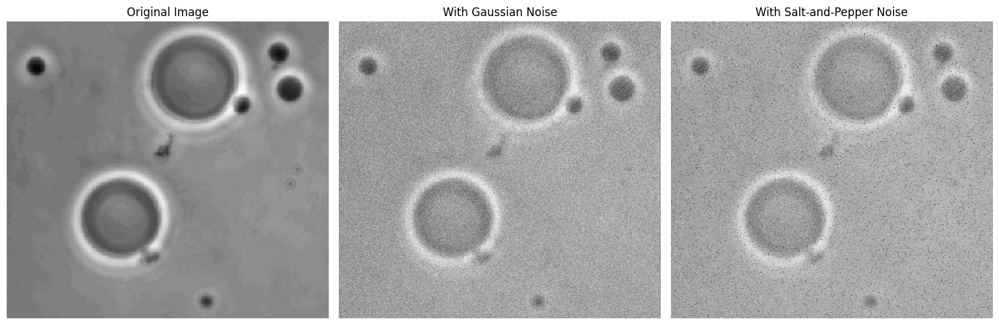

True

In [20]:
noise_image = cv2.imread('noise.tif', cv2.IMREAD_GRAYSCALE)

# If image loading failed, create a sample image
if noise_image is None:
    # Create a sample image
    noise_image = np.zeros((256, 256), dtype=np.uint8)
    noise_image[64:192, 64:192] = 200  # Add a white square in the middle

# Add Gaussian noise
gaussian_noisy = add_noise(noise_image, 0, [0, 25])  # mean=0, sigma=25

# Add Salt-and-Pepper noise
sp_noisy = add_noise(noise_image, 1, [0.05])  # probability=0.05

# Plot the original and noisy images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(noise_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(gaussian_noisy, cmap='gray')
plt.title('With Gaussian Noise')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sp_noisy, cmap='gray')
plt.title('With Salt-and-Pepper Noise')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the noisy images
cv2.imwrite('Q6-output-gaussian-noise.jpg', gaussian_noisy)
cv2.imwrite('Q6-output-salt-pepper-noise.jpg', sp_noisy)

In [21]:
def denoise(noisy_image):

  '''
  input:
    noisy_image (ndarray): the noisy image

  output:
    output_image (ndarray): denoised image

  '''
  ###############################################
  ############# YOUR CODE GOES HERE #############
 # For Salt-and-Pepper noise, median filter is an effective approach
  # Use a 3x3 median filter
  output = np.zeros_like(noisy_image)
  
  # Check if image is grayscale or color
  if len(noisy_image.shape) == 2:
    # Grayscale image
    height, width = noisy_image.shape
    
    # Apply median filter
    for i in range(1, height - 1):
      for j in range(1, width - 1):
        # Extract 3x3 neighborhood
        neighborhood = noisy_image[i-1:i+2, j-1:j+2]
        # Apply median filter
        output[i, j] = np.median(neighborhood)
    
    # Handle borders by copying the nearest processed pixels
    output[0, :] = output[1, :]
    output[-1, :] = output[-2, :]
    output[:, 0] = output[:, 1]
    output[:, -1] = output[:, -2]
  
  else:
    # Color image
    height, width, channels = noisy_image.shape
    
    # Process each channel independently
    for c in range(channels):
      for i in range(1, height - 1):
        for j in range(1, width - 1):
          # Extract 3x3 neighborhood for the current channel
          neighborhood = noisy_image[i-1:i+2, j-1:j+2, c]
          # Apply median filter
          output[i, j, c] = np.median(neighborhood)
      
      # Handle borders by copying the nearest processed pixels
      output[0, :, c] = output[1, :, c]
      output[-1, :, c] = output[-2, :, c]
      output[:, 0, c] = output[:, 1, c]
      output[:, -1, c] = output[:, -2, c]
  
  ###############################################
  return output

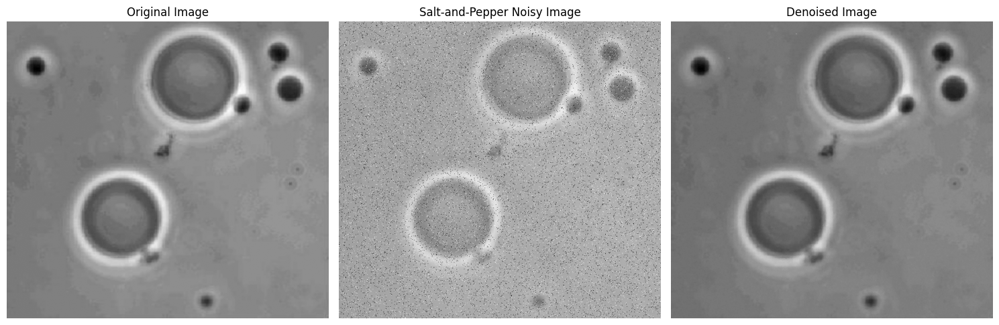

Salt-and-Pepper noise was successfully removed using a median filter.
The median filter is particularly effective for this type of noise as it
replaces outlier values (salt and pepper) with more representative values
from the local neighborhood.


In [22]:
sp_noisy_image = cv2.imread('Q6-output-salt-pepper-noise.jpg', cv2.IMREAD_GRAYSCALE)

# If image loading failed, create a noisy sample
if sp_noisy_image is None:
    # Create a sample image and add salt and pepper noise
    sample = np.zeros((256, 256), dtype=np.uint8)
    sample[64:192, 64:192] = 200  # Add a white square in the middle
    sp_noisy_image = add_noise(sample, 1, [0.05])  # probability=0.05

# Denoise the salt-and-pepper noisy image
denoised_image = denoise(sp_noisy_image)

# Plot the noisy and denoised images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(noise_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sp_noisy_image, cmap='gray')
plt.title('Salt-and-Pepper Noisy Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(denoised_image, cmap='gray')
plt.title('Denoised Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the denoised image
cv2.imwrite('Q6-output-denoised.jpg', denoised_image)

print("Salt-and-Pepper noise was successfully removed using a median filter.")
print("The median filter is particularly effective for this type of noise as it")
print("replaces outlier values (salt and pepper) with more representative values")
print("from the local neighborhood.")